<a href="https://colab.research.google.com/github/mschoder/sugarcane-weed-classification/blob/master/models/Detectron_FasterRCNN_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# install dependencies: 
!pip install pyyaml==5.1 'pycocotools>=2.0.1'
!pip install torch==1.6.0+cu101 torchvision==0.7.0+cu101 -f https://download.pytorch.org/whl/torch_stable.html

import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

Looking in links: https://download.pytorch.org/whl/torch_stable.html
1.6.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [2]:
# install detectron2: (Colab has CUDA 10.1 + torch 1.6)
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
assert torch.__version__.startswith("1.6")
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html


In [4]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random, copy
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data import detection_utils as utils


## Connect to GCP Bucket where image and label data are stored
(Requires access to the project on GCP)

In [5]:
# Install gcsfuse to access gcp bucket directly
!echo "deb http://packages.cloud.google.com/apt gcsfuse-bionic main" > /etc/apt/sources.list.d/gcsfuse.list
!curl https://packages.cloud.google.com/apt/doc/apt-key.gpg | apt-key add -
!apt -qq update
!apt -qq install gcsfuse

# Log in for GCP bucket access
from google.colab import auth
auth.authenticate_user()

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   653  100   653    0     0  29681      0 --:--:-- --:--:-- --:--:-- 31095
OK
40 packages can be upgraded. Run 'apt list --upgradable' to see them.
gcsfuse is already the newest version (0.32.0).
0 upgraded, 0 newly installed, 0 to remove and 40 not upgraded.


In [6]:
# Connect to gcp data bucket
!mkdir data
!gcsfuse --implicit-dirs crop-weed-bucket data 

# Verify acces
!ls data/

Using mount point: /content/data
Opening GCS connection...
Mounting file system...
File system has been successfully mounted.
allweeds_1200x800  bounding_boxes	raw_images  trained_models
allweeds_600x400   jpg_images_allweeds	raw_video


## Build a custom pytorch dataset that can be registered


In [7]:
from detectron2.structures import BoxMode

def get_weed_dicts(img_dir, file_list):
    json_file = os.path.join(img_dir, "_weed_labels.json")
    with open(json_file) as f:
        img_anns = json.load(f)

    dataset_dicts = []
    for idx, v in enumerate(img_anns.values()):
        if v["filename"] in file_list:  # train or test data
            record = {}
            filename = os.path.join(img_dir, v["filename"])
            height, width = cv2.imread(filename).shape[:2]

            record["file_name"] = filename
            record["image_id"] = idx
            record["height"] = height
            record["width"] = width

            annos = v["regions"]   # List of object attributes
            objs = []
            for anno in annos:
                if anno["region_attributes"]["label"] == "weed":
                    sa = anno["shape_attributes"]
                    obj = {
                        "bbox": [sa['x'], sa['y'], sa['width'], sa['height']],
                        "bbox_mode": BoxMode.XYWH_ABS, # or XYXY_ABS
                        "category_id": 0 if anno["region_attributes"]["label"] == "weed" else 1
                    }
                    objs.append(obj)
            record["annotations"] = objs
            dataset_dicts.append(record)
    return dataset_dicts


In [8]:
# Create and register datasets
img_dir = 'data/allweeds_600x400/'
json_file = os.path.join(img_dir, "_weed_labels.json")
with open(json_file) as f:
    img_anns = json.load(f)

file_list = sorted([k for k in img_anns.keys()])
print("Number of images: ", len(file_list))
np.random.seed(21)
np.random.shuffle(file_list)
val_pct = 0.3
file_lists = {
    "val": file_list[:int(val_pct * len(file_list))],
    "train": file_list[int(val_pct * len(file_list)):]
}

DatasetCatalog.clear()
for d in ["train", "val"]:
    DatasetCatalog.register("weeds_" + d, lambda d=d: get_weed_dicts(img_dir, file_lists[d]))
    MetadataCatalog.get("weeds_" + d).set(thing_classes=["weed"])
weeds_metadata = MetadataCatalog.get("weeds_train")

# Build full dict
print('Creating datasets...')
dataset_dicts = get_weed_dicts(img_dir, file_lists['train'])
print('Datasets created')

Number of images:  285
Creating datasets...
Datasets created


data/allweeds_600x400/i3060.jpg


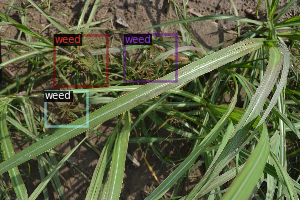

data/allweeds_600x400/i2901.jpg


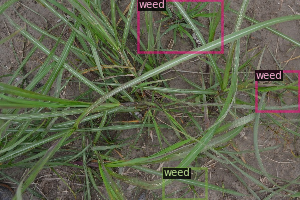

In [9]:
# Verify labels

for d in random.sample(dataset_dicts, 2):
    img = cv2.imread(d["file_name"])
    print(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=weeds_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

## Check GPU availability

In [10]:
# # memory footprint support libraries/code
# !ln -sf /opt/bin/nvidia-smi /usr/bin/nvidia-smi
# !pip install gputil
# !pip install psutil
# !pip install humanize

# import psutil
# import humanize
# import os
# import GPUtil as GPU
# GPUs = GPU.getGPUs()

# # XXX: only one GPU on Colab and isn’t guaranteed
# gpu = GPUs[0]
# def printm():
#   process = psutil.Process(os.getpid())
#   print("Gen RAM Free: " + humanize.naturalsize( psutil.virtual_memory().available ), " | Proc size: " + humanize.naturalsize( process.memory_info().rss))
#   print("GPU RAM Free: {0:.0f}MB | Used: {1:.0f}MB | Util {2:3.0f}% | Total {3:.0f}MB".format(gpu.memoryFree, gpu.memoryUsed, gpu.memoryUtil*100, gpu.memoryTotal))

# printm()

In [11]:
!nvidia-smi

## Uncomment below to clear GPU
# torch.cuda.empty_cache()

Fri Nov 13 18:07:36 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.32.00    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   33C    P8     9W /  70W |     10MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Build a custom trainer which inherits from default
- Get custom eval metrics while training
- Apply desired augmentations / transformations

In [20]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator
import detectron2.data.transforms as T
from detectron2.data import DatasetMapper   # the default mapper
from detectron2.data import build_detection_train_loader


def custom_mapper(dataset_dict):
    # Implement a mapper, similar to the default DatasetMapper, but with your own customizations
    dataset_dict = copy.deepcopy(dataset_dict)  # it will be modified by code below
    image = utils.read_image(dataset_dict["file_name"], format="RGB")
    transform_list = []
    # Rotate 90 degrees to landscape if image is in portrait format
    height, width, _ = image.shape
    if height > width:
        transform_list.append(T.RotationTransform)
    transform_list = [
                    #   T.RandomCrop('relative_range', (0.7, 0.7)),
                      T.RandomFlip(prob=0.5, horizontal=False, vertical=True),
                    #   T.RandomFlip(prob=0.5, horizontal=True, vertical=False),
                    #   CLAHE_Augmentation()
                      T.RandomBrightness(0.70, 1.3),
                      T.RandomContrast(0.7, 1.3),
                      T.RandomSaturation(0.7, 1.3),
                    #   T.ResizeShortestEdge(short_edge_length=[640, 672, 704, 736, 768, 800], max_size=1333, sample_style='choice')
                      ]
    image, transforms = T.apply_transform_gens(transform_list, image)
    dataset_dict["image"] = torch.as_tensor(image.transpose(2, 0, 1).astype("float32"))

    annos = [
        utils.transform_instance_annotations(obj, transforms, image.shape[:2])
        for obj in dataset_dict.pop("annotations")
        if obj.get("iscrowd", 0) == 0
    ]
    instances = utils.annotations_to_instances(annos, image.shape[:2])
    dataset_dict["instances"] = utils.filter_empty_instances(instances)
    return dataset_dict


class CocoTrainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):

        if output_folder is None:
            os.makedirs("coco_eval", exist_ok=True)
            output_folder = "coco_eval"

        return COCOEvaluator(dataset_name, cfg, False, output_folder)

    @classmethod
    def build_train_loader(cls, cfg):
        return build_detection_train_loader(cfg, mapper=custom_mapper)


## Define Configs

In [27]:
### TRAINING CONFIG
cfg = get_cfg()


### Select base model & initialized weights
# cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
# cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  

cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml") 

# cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
# cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  


cfg.DATASETS.TRAIN = ("weeds_train",)
cfg.DATASETS.TEST = ("weeds_val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.00025  # TODO - tweak
cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 3000    # TODO - adjust based on validation mAP
# cfg.SOLVER.STEPS = (00, 1500)
# cfg.SOLVER.GAMMA = 0.05

cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only one class (weed), other class is background

cfg.TEST.EVAL_PERIOD = 500

cfg.OUTPUT_DIR = './data/output'

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)

[11/13 18:29:30 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

## Validate augmentations

In [28]:
train_data_loader = trainer.build_train_loader(cfg)
data_iter = iter(train_data_loader)

[11/13 18:30:28 d2.data.build]: Removed 0 images with no usable annotations. 200 images left.
[11/13 18:30:28 d2.data.build]: Using training sampler TrainingSampler
[11/13 18:30:28 d2.data.common]: Serializing 200 elements to byte tensors and concatenating them all ...
[11/13 18:30:28 d2.data.common]: Serialized dataset takes 0.07 MiB


/usr/local/lib/python3.6/dist-packages/fvcore/transforms/transform.py:433: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:141.)
  tensor = torch.from_numpy(np.ascontiguousarray(img))
/usr/local/lib/python3.6/dist-packages/fvcore/transforms/transform.py:433: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be

Image shape:  0 (400, 600, 3)
Image shape:  1 (400, 600, 3)
Image shape:  2 (400, 600, 3)
Image shape:  3 (400, 600, 3)


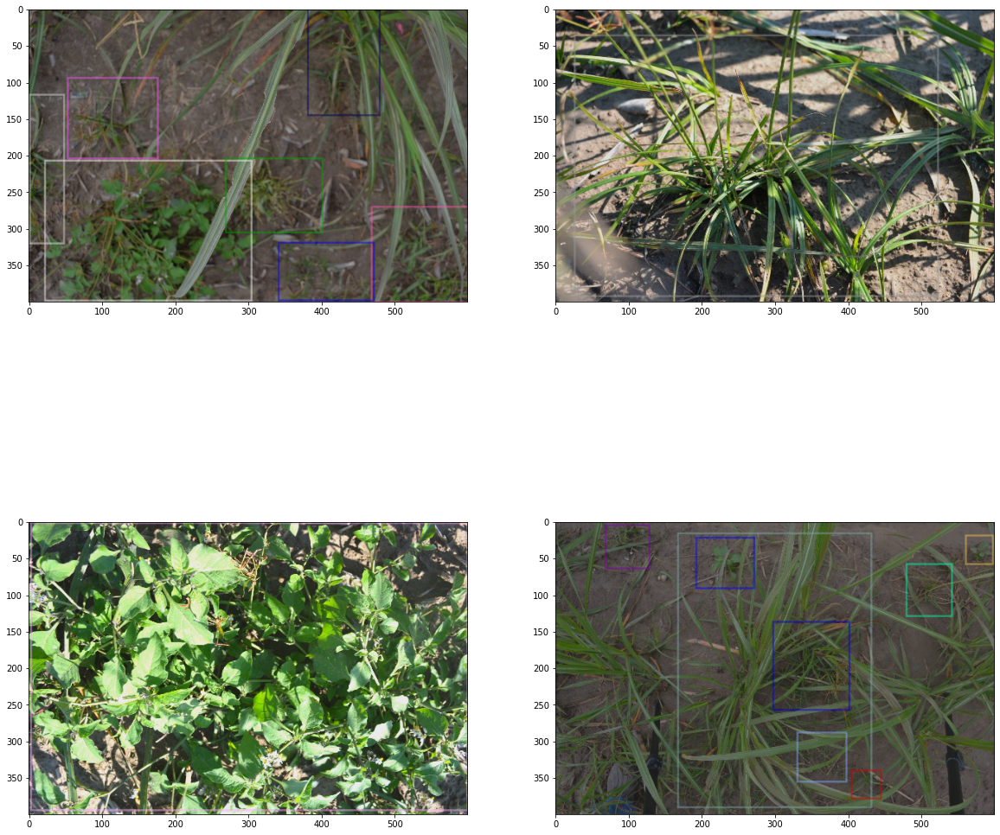

In [29]:
batch = next(data_iter)

rows, cols = 2, 2
plt.figure(figsize=(20,20))

for i, per_image in enumerate(batch[:4]):
    plt.subplot(rows, cols, i+1)
    
    # Pytorch tensor is in (C, H, W) format
    img = per_image["image"].permute(1, 2, 0).cpu().detach().numpy()
    img = utils.convert_image_to_rgb(img, cfg.INPUT.FORMAT)
    print('Image shape: ', i, img.shape)

    visualizer = Visualizer(img, metadata=weeds_metadata, scale=1.0)

    target_fields = per_image["instances"].get_fields()
    labels = None
    vis = visualizer.overlay_instances(
        labels=labels,
        boxes=target_fields.get("gt_boxes", None),
        masks=target_fields.get("gt_masks", None),
        keypoints=target_fields.get("gt_keypoints", None),
    )
    plt.imshow(vis.get_image()[:, :, ::-1])


## Train Model

In [30]:
# TRAIN
# trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

model_final_f6e8b1.pkl: 243MB [00:03, 64.9MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.


[11/13 18:30:35 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.6/dist-packages/fvcore/transforms/transform.py:433: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:141.)
  tensor = torch.from_numpy(np.ascontiguousarray(img))
/usr/local/lib/python3.6/dist-packages/fvcore/transforms/transform.py:433: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be

[11/13 18:30:44 d2.utils.events]:  eta: 0:22:16  iter: 19  total_loss: 1.92  loss_cls: 0.81  loss_box_reg: 0.5627  loss_rpn_cls: 0.5594  loss_rpn_loc: 0.04538  time: 0.4525  data_time: 0.0355  lr: 4.9953e-06  max_mem: 2891M
[11/13 18:30:54 d2.utils.events]:  eta: 0:22:23  iter: 39  total_loss: 1.7  loss_cls: 0.7053  loss_box_reg: 0.5317  loss_rpn_cls: 0.4088  loss_rpn_loc: 0.03268  time: 0.4549  data_time: 0.0122  lr: 9.9902e-06  max_mem: 2891M
[11/13 18:31:04 d2.utils.events]:  eta: 0:22:25  iter: 59  total_loss: 1.332  loss_cls: 0.5369  loss_box_reg: 0.5146  loss_rpn_cls: 0.2841  loss_rpn_loc: 0.02599  time: 0.4579  data_time: 0.0145  lr: 1.4985e-05  max_mem: 2891M
[11/13 18:31:13 d2.utils.events]:  eta: 0:22:24  iter: 79  total_loss: 1.276  loss_cls: 0.4627  loss_box_reg: 0.5782  loss_rpn_cls: 0.2435  loss_rpn_loc: 0.02528  time: 0.4606  data_time: 0.0133  lr: 1.998e-05  max_mem: 2891M
[11/13 18:31:23 d2.utils.events]:  eta: 0:22:22  iter: 99  total_loss: 1.295  loss_cls: 0.4479  lo

In [32]:
# Look at training curves in tensorboard
%reload_ext tensorboard
%tensorboard --logdir output

Reusing TensorBoard on port 6006 (pid 3018), started 0:00:12 ago. (Use '!kill 3018' to kill it.)

<IPython.core.display.Javascript object>

In [35]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join("data/output/model_final.pth")  # path to trained model
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

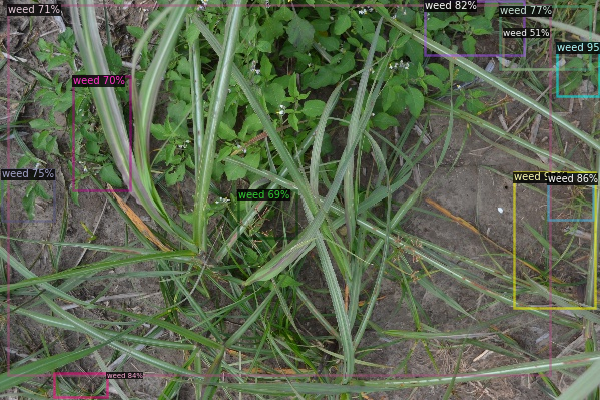

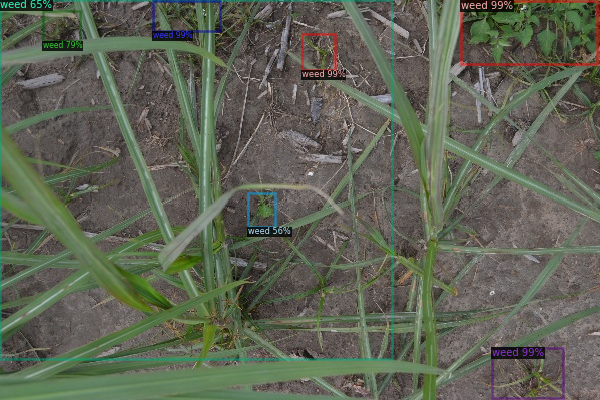

In [36]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_weed_dicts(img_dir, file_lists['val'])
for d in random.sample(dataset_dicts, 2):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=weeds_metadata, 
                   scale=1, 
                   instance_mode=ColorMode.IMAGE   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [37]:
# TODO - calculate the Intersection / Total Frame Pixels as % weed coverage
outputs


{'instances': Instances(num_instances=7, image_height=400, image_width=600, fields=[pred_boxes: Boxes(tensor([[492.0002, 348.1443, 563.1809, 397.8591],
         [152.9501,   0.7773, 220.3698,  31.3469],
         [460.9001,   1.1866, 596.9611,  63.8864],
         [301.5926,  33.8311, 334.8867,  70.4657],
         [ 42.5395,  10.6826,  79.6919,  41.4168],
         [  0.0000,   0.0000, 392.0491, 359.4475],
         [248.1177, 193.1038, 275.3620, 227.4857]], device='cuda:0')), scores: tensor([0.9944, 0.9906, 0.9901, 0.9884, 0.7944, 0.6482, 0.5590],
        device='cuda:0'), pred_classes: tensor([0, 0, 0, 0, 0, 0, 0], device='cuda:0')])}

In [38]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("weeds_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "weeds_val")
print(inference_on_dataset(trainer.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

WARNING [11/13 19:00:46 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass tasks in directly
[11/13 19:00:51 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/13 19:00:51 d2.data.common]: Serializing 85 elements to byte tensors and concatenating them all ...
[11/13 19:00:51 d2.data.common]: Serialized dataset takes 0.03 MiB
[11/13 19:00:51 d2.evaluation.evaluator]: Start inference on 85 images
[11/13 19:00:53 d2.evaluation.evaluator]: Inference done 11/85. 0.1466 s / img. ETA=0:00:10
[11/13 19:00:59 d2.evaluation.evaluator]: Inference done 45/85. 0.1468 s / img. ETA=0:00:05
[11/13 19:01:04 d2.evaluation.evaluator]: Inference done 79/85. 0.1471 s / img. ETA=0:00:00
[11/13 19:01:05 d2.evaluation.evaluator]: Total inference time: 0:00:12.022393 (0.150280 s / img per device, on 1 devices)
[11/13 19:01:05 d2.eval

## Video Processing


In [51]:
def run_video_thru_model(input, output, out_size=(600,400)):

    cap = cv2.VideoCapture(input)
    fourcc = cv2.VideoWriter_fourcc('m', 'p', '4', 'v') # Codec format
    out_writer = cv2.VideoWriter(output, fourcc, 20.0, out_size)

    framecount = 0
    while(cap.isOpened()):
        ret, frame = cap.read()
        if ret==True:
            framecount += 1
            if framecount % 100 == 0:
                print(framecount, " Frames Processed")

            # Get model predictions
            outputs = predictor(frame)
            v = Visualizer(frame[:, :, ::-1],
                    metadata=weeds_metadata, 
                    scale=1, 
                    instance_mode=ColorMode.IMAGE
            )
            out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
            outframe = out.get_image()[:, :, ::-1]

            # write the output frame
            out_writer.write(outframe)

            # cv2.imshow('frame', frame)
            if cv2.waitKey(1) & 0xFF == ord('q'):
                break
        else:
            break

    # Release everything if job is finished
    cap.release()
    out_writer.release()
    cv2.destroyAllWindows()

In [52]:
input_vid = 'data/raw_video/test_vid.avi'
output_vid = 'data/raw_video/processed_test_vid.avi'
run_video_thru_model(input_vid, output_vid)

100  Frames Processed
200  Frames Processed
300  Frames Processed
400  Frames Processed
500  Frames Processed
